In [33]:
# install
!pip install transformers datasets kagglehub pandas nltk wordcloud statsmodels

In [33]:
# libraries
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification
import kagglehub
from kagglehub import KaggleDatasetAdapter
import pandas as pd
import os
import torch
from collections import Counter
from nltk.tokenize import sent_tokenize
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import statsmodels.api as sm
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import statsmodels.formula.api as smf
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

In [4]:
# load huggingface model
model_name = "brunokrp/classification_model_protectionism"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

In [5]:
# load speeches
# Download latest version
path = kagglehub.dataset_download("jyronw/us-state-of-the-union-addresses-1790-2019")

print("Path to dataset files:", path)

Path to dataset files: /Users/angelbrummett/.cache/kagglehub/datasets/jyronw/us-state-of-the-union-addresses-1790-2019/versions/1


In [5]:
# List all files in the dataset directory
files = os.listdir(path)
print("Files in dataset:", files)

Files in dataset: ['state_ofthe_union_texts.csv']


In [6]:
df_sotu = pd.read_csv(os.path.join(path,"state_ofthe_union_texts.csv"))
df_sotu.head()

,President,Year,Title,Text
0,George Washington,1790,First State of the Union Address,['I embrace with great satisfaction the opport...
1,George Washington,1790,Second State of the Union Address,['Fellow-Citizens of the Senate and the House ...
2,George Washington,1791,Third State of the Union Address,['Fellow-Citizens of the Senate and the House ...
3,George Washington,1792,Fourth State of the Union Address,['Fellow-Citizens of the Senate and of the Hou...
4,George Washington,1793,Fifth State of the Union Address,['Fellow Citizens of the Senate and of the Hou...


In [7]:
# confidence scores
def classify_text(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1)
    return probs[0].tolist()  # returns list of probabilities for each class

# Example: apply to just the first 10 rows
# df_sotu["protectionism_probs"] = df_sotu["Text"].head(10).apply(classify_text)

# predicted label (0 = no, 1 = yes)
def predict_label(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    return torch.argmax(outputs.logits).item()

# Apply to first 10 rows (adjust as needed)
# df_sotu["protectionism_label"] = df_sotu["Text"].head(10).apply(predict_label)

# df_sotu.head(10)

In [12]:
# add those post 2019
# y'all the csv looks crazy but it works TRUST
from google.colab import files
uploaded = files.upload()

Saving state_ofthe_union_texts_updated_complete.csv to state_ofthe_union_texts_updated_complete.csv


In [8]:
# load the new dataset
# Replace with actual file name
# filter 1974-2024
df_sotu2025 = pd.read_csv('state_ofthe_union_texts_updated_complete.csv')
# filter sotu 2025 to fit economic dataset (1974 - 2024)
df_sotu2025 = df_sotu2025[df_sotu2025['Year'].between(1974, 2024)]

df_sotu2025.head(51)

,President,Year,Title,Text
179,Richard Nixon,1974,Fifth State of the Union Address,['We meet here tonight at a time of great chal...
180,Gerald Ford,1975,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman..."
181,Gerald Ford,1976,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ..."
182,Gerald Ford,1977,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ..."
183,Jimmy Carter,1978,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ..."
184,Jimmy Carter,1979,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9..."
185,Jimmy Carter,1980,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...
186,Jimmy Carter,1981,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The..."
187,Ronald Reagan,1982,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb..."
188,Ronald Reagan,1983,Ronald Reagan's Second State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb..."


In [ ]:
df_sotu2025.tail(6)

In [9]:
# parties
president_party_1974 = {
    'Richard Nixon': 'Republican',
    'Gerald Ford': 'Republican',
    'Jimmy Carter': 'Democratic',
    'Ronald Reagan': 'Republican',
    'George Herbert Walker Bush': 'Republican',
    'Bill Clinton': 'Democratic',
    'George W. Bush': 'Republican',
    'Barack Obama': 'Democratic',
    'Donald Trump': 'Republican',
    'Joseph R. Biden, Jr.': 'Democratic'
}

In [10]:
# add if they are republican or democrat
df_sotu2025["Party"] = df_sotu2025["President"].map(president_party_1974)
df_sotu2025.head(51)

,President,Year,Title,Text,Party
179,Richard Nixon,1974,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,Republican
180,Gerald Ford,1975,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",Republican
181,Gerald Ford,1976,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",Republican
182,Gerald Ford,1977,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",Republican
183,Jimmy Carter,1978,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",Democratic
184,Jimmy Carter,1979,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",Democratic
185,Jimmy Carter,1980,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,Democratic
186,Jimmy Carter,1981,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The...",Democratic
187,Ronald Reagan,1982,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",Republican
188,Ronald Reagan,1983,Ronald Reagan's Second State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",Republican


In [11]:
# guys I am so sorry I forgot to preprocess/clean the text
# please don't hate me
# here it is

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt_tab')

stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    text = text.lower()
    tokens = nltk.word_tokenize(text)
    tokens = [t for t in tokens if t not in string.punctuation]
    tokens = [t for t in tokens if t not in stop_words]
    tokens = [lemmatizer.lemmatize(t) for t in tokens]
    return " ".join(tokens)

# Apply to your speeches
df_sotu2025["Cleaned_Text"] = df_sotu2025["Text"].apply(preprocess_text)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/angelbrummett/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/angelbrummett/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/angelbrummett/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/angelbrummett/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/angelbrummett/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [12]:
# fix possible merge issues

def fix_token_merges(text):
    if not isinstance(text, str):
        return text
    # Add space between lowercase letter followed by uppercase
    text = re.sub(r'(?<=[a-z])(?=[A-Z])', ' ', text)
    # Add space between a letter and a digit
    text = re.sub(r'(?<=[a-zA-Z])(?=\d)', ' ', text)
    text = re.sub(r'(?<=\d)(?=[a-zA-Z])', ' ', text)
    # Add space between a letter and punctuation if merged (optional, depending on your needs)
    text = re.sub(r'(?<=[a-zA-Z])(?=[.,!?])', ' ', text)
    return text

# Apply the function to the 'Cleaned_Text' column
df_sotu2025['Cleaned_Text'] = df_sotu2025['Cleaned_Text'].apply(fix_token_merges)


In [13]:
# apply to all speeches

df_sotu2025["protectionism_probs"] = df_sotu2025["Text"].apply(classify_text)
df_sotu2025["protectionism_label"] = df_sotu2025["Text"].apply(predict_label)

In [14]:
# cleaned text
df_sotu2025["protectionism_probs_cleaned"] = df_sotu2025["Cleaned_Text"].apply(classify_text)
df_sotu2025["protectionism_label_cleaned"] = df_sotu2025["Cleaned_Text"].apply(predict_label)

In [45]:
# head
df_sotu2025.head(10)

,President,Year,Title,Text,Party,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned
179,Richard Nixon,1974,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,Republican,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1
180,Gerald Ford,1975,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",Republican,'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1
181,Gerald Ford,1976,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",Republican,'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0
182,Gerald Ford,1977,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",Republican,'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1
183,Jimmy Carter,1978,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",Democratic,`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0
184,Jimmy Carter,1979,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",Democratic,'mr president mr . speaker member 96 th congre...,"[0.996171772480011, 0.0038282021414488554]",0,"[0.7404575347900391, 0.25954240560531616]",0
185,Jimmy Carter,1980,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,Democratic,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1
186,Jimmy Carter,1981,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The...",Democratic,'to congress united state 'the state union sou...,"[0.8378113508224487, 0.16218861937522888]",0,"[0.9765282273292542, 0.023471815511584282]",0
187,Ronald Reagan,1982,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",Republican,mr . speaker mr . president distinguished memb...,"[0.7072977423667908, 0.29270222783088684]",0,"[0.0039596231654286385, 0.9960403442382812]",1
188,Ronald Reagan,1983,Ronald Reagan's Second State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",Republican,mr . speaker mr . president distinguished memb...,"[0.8743921518325806, 0.12560784816741943]",0,"[0.722859263420105, 0.277140736579895]",0


In [34]:
# validating the pretrained model

def calculatemetrics(y_true, y_pred, classifier_name):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    # Specificity is only meaningful for binary classification
    if len(set(y_true)) == 2:
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    else:
        specificity = "N/A (not binary classification)"

    print(f"Performance metrics for {classifier_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"Specificity: {specificity}")
    print(f"F1 Score: {f1:.2f}")
    print()

In [15]:
# reorder so party comes between president and year
df_sotu2025 = df_sotu2025[['Year', 'President', 'Party', 'Title', 'Text', 'Cleaned_Text', 'protectionism_probs', 'protectionism_label', 'protectionism_probs_cleaned', 'protectionism_label_cleaned']]

In [16]:
# tail
df_sotu2025.tail(10)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned
220,2015,Barack Obama,Democratic,Barack Obama's Seventh State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.836644172668457, 0.1633557826280594]",0,"[0.17177629470825195, 0.8282237648963928]",1
221,2016,Barack Obama,Democratic,Barack Obama's Eighth State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.9823514223098755, 0.017648648470640182]",0,"[0.8495701551437378, 0.15042990446090698]",0
222,2017,Donald Trump,Republican,Donald Trump's First State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.9628185629844666, 0.037181440740823746]",0,"[0.129221573472023, 0.8707783818244934]",1
223,2018,Donald Trump,Republican,Donald Trump's Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.929481029510498, 0.07051897048950195]",0,"[0.03719846531748772, 0.9628015756607056]",1
224,2019,Donald Trump,Republican,Donald Trump's Third State of the Union Address,"['Madam Speaker, Mr. Vice President, Members o...",'madam speaker mr . vice president member cong...,"[0.994796097278595, 0.005203882697969675]",0,"[0.9381179213523865, 0.061882134526968]",0
225,2020,Donald Trump,Republican,Donald Trump's Fourth State of the Union Address,"Madam Speaker, Mr. Vice President, Members of ...",madam speaker mr . vice president member congr...,"[0.9800789952278137, 0.019920989871025085]",0,"[0.02515915222465992, 0.9748408794403076]",1
226,2021,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s First State of the Union Add...,The President.Thank you. Thank you. Thank you....,president .thank thank thank good back mitch c...,"[0.9692818522453308, 0.030718110501766205]",0,"[0.7622029185295105, 0.2377970665693283]",0
227,2022,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s Second State of the Union Ad...,"The President.Thank you all very, very much. T...",president .thank much thank please thank much ...,"[0.2610573172569275, 0.7389427423477173]",1,"[0.159772127866745, 0.8402278423309326]",1
228,2023,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s Third State of the Union Add...,"The President.Mr. Speaker——\n\n[At this point,...",president .mr speaker—— point president turned...,"[0.985309898853302, 0.014690114185214043]",0,"[0.09464648365974426, 0.9053534865379333]",1
229,2024,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s Fourth State of the Union Ad...,"[Before speaking, the President presented his ...",speaking president presented prepared remark s...,"[0.6627640128135681, 0.3372359573841095]",0,"[0.8283075094223022, 0.17169252038002014]",0


In [ ]:
# track against economic crisis
# kagglehub dataset?
path = kagglehub.dataset_download("alfredkondoro/u-s-economic-indicators-1974-2024")

print("Path to dataset files:", path)

# include recessions

In [18]:
# protectionism keywords
protectionism_keywords_list = [
    # Core Concepts
    "Protectionism",
    "Economic Independence",
    "Self-Sufficiency",
    "Autarky",
    "Domestic Industry Protection",
    "National Industry Support",
    "Infant Industry Protection",
    "Economic Sovereignty",
    "National Economic Security",

    # Trade Barriers & Measures
    "Tariffs",
    "Import Tariffs",
    "Export Tariffs",
    "Non-Tariff Barriers (NTB)",
    "Quotas",
    "Import Quotas",
    "Export Quotas",
    "Import Restrictions",
    "Export Restrictions",
    "Export Bans",
    "Trade Restrictions",
    "Duties",
    "Anti-Dumping Duties",
    "Countervailing Duties",
    "Price Controls",
    "Trade Sanctions",
    "Economic Sanctions",
    "Embargoes",
    "Currency Manipulation",
    "Exchange Rates",

    # Trade & Globalization
    "Trade War",
    "Trade Conflict",
    "Trade Deficit",
    "Trade Surplus",
    "Trade Agreements",
    "Bilateral Trade Deals",
    "Multilateral Trade Agreements",
    "Free Trade",
    "Fair Trade",
    "Free Trade Agreements (FTA)",
    "Preferential Trade Agreements",
    "Import-Export Policy",
    "Foreign Trade",
    "Globalization",
    "Deglobalization",
    "Economic Nationalism",
    "Nationalistic Trade Policy",
    "Market Access",
    "Trade Barriers",
    "Open Markets",
    "Market Protection",

    # Protectionist Rhetoric & Phrases
    "Buy American",
    "Buy American, Hire American",
    "America First",
    "Fair Trade, Not Free Trade",
    "Rebuilding American Industry",
    "Bring Jobs Back",
    "Keep Jobs at Home",
    "Outsourcing American Jobs",
    "Stopping the Export of American Jobs",
    "Revive American Manufacturing",
    "Protect American Workers",
    "Protecting Our Borders and Our Economy",
    "American-Made",
    "Keeping Factories in America",
    "Repatriating Jobs",
    "Ending the Trade Deficit",
    "The American Worker",

    # Industries
    "Steel",
    "Aluminum",
    "Automotive",
    "Agriculture / Farming",
    "Textiles / Apparel",
    "Technology / Semiconductors",
    "Energy (esp. Oil & Gas)",
    "Manufacturing",
    "Electronics",
    "Pharmaceuticals",
    "Defense / Military Industry",
    "Shipbuilding",
    "Mining / Rare Earths",

    # Countries
    "China",
    "Iran",
    "Cuba",
    "Russia",
    "Mexico",
    "Japan",
    "Canada",
    "South Korea",
    "Vietnam",
    "India",
    "European Union (EU)",
    "United States",
    "America"
]


In [42]:
protectionism_keywords_list = [kw.lower() for kw in protectionism_keywords_list]

In [43]:
# protectionism intensity
def score_intensity(sotu_text, keywords):
  text_lower = sotu_text.lower()
  keyword_counts = Counter()

  for kw in keywords:
      count = text_lower.count(kw.lower())
      if count > 0:
          keyword_counts[kw] = count

  return {
      "total_protectionist_mentions": sum(keyword_counts.values()),
      "keyword_breakdown": dict(keyword_counts)
    }
# df_sotu2025["Protectionist_Mentions"] = df_sotu2025["Cleaned_Text"].apply(lambda text: score_intensity(text, protectionism_keywords_list)["total_protectionist_mentions"])

In [44]:
# add to thingy
df_sotu2025[['Protectionist_Mentions', 'Keyword_Breakdown']] = df_sotu2025['Cleaned_Text'].apply(
    lambda text: pd.Series(score_intensity(text, protectionism_keywords_list))
)

In [64]:
# calculate mean & median of protectionist mentions

mean_value = df_sotu2025['Protectionist_Mentions'].mean()
median_value = df_sotu2025['Protectionist_Mentions'].median()
maximum_value = df_sotu2025['Protectionist_Mentions'].max()
minimum_value = df_sotu2025['Protectionist_Mentions'].min()
range_value = df_sotu2025['Protectionist_Mentions'].max() - df_sotu2025['Protectionist_Mentions'].min()

print(f"Mean: {mean_value}")
print(f"Median: {median_value}")
print(f"Max: {maximum_value}")
print(f"Max: {minimum_value}")
print(f"Range: {range_value}")

Mean: 72.66666666666667
Median: 68.0
Max: 185
Max: 25
Range: 160


In [75]:
# validation labels to compare against pretrained model  - keywords

def label_from_intensity(mentions, threshold= 68):
    return int(mentions >= threshold)

df_sotu2025["TrueLabel_Keywords"] = df_sotu2025["Protectionist_Mentions"].apply(lambda x: label_from_intensity(x, threshold=50))

In [58]:
df_sotu2025.head(51)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,Protectionist_Mentions,Keyword_Breakdown,theme_scores,theme_scores_cleaned,Protectionism_Intensity,sentiment_details,sentiment_scores,sentiment_details_cleaned,sentiment_scores_cleaned,TrueLabel
179,1974,Richard Nixon,Republican,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1,71,"{'china': 3, 'america': 68}","{'Protectionism': 0.18609116971492767, 'Suppor...",{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.995292842388...",0.995690,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.978112,1
180,1975,Gerald Ford,Republican,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1,26,"{'automotive': 1, 'manufacturing': 1, 'china':...",{'Support for domestic industry': 0.1468775719...,{'Support for domestic industry': 0.0994148105...,0.071429,"[{'label': 'POSITIVE', 'score': 0.946522772312...",0.932287,"[{'label': 'NEGATIVE', 'score': 0.967526435852...",0.974468,0
181,1976,Gerald Ford,Republican,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0,57,"{'china': 1, 'mexico': 1, 'japan': 1, 'america...",{'Support for domestic industry': 0.1728355884...,{'Support for domestic industry': 0.1164492517...,0.071429,"[{'label': 'POSITIVE', 'score': 0.997840762138...",0.997840,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.655736,1
182,1977,Gerald Ford,Republican,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1,36,"{'protectionism': 1, 'china': 2, 'japan': 2, '...","{'Job repatriation': 0.152089923620224, 'Suppo...",{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.996929109096...",0.997659,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.970723,0
183,1978,Jimmy Carter,Democratic,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0,35,"{'protectionism': 1, 'trade deficit': 1, 'free...",{'Support for domestic industry': 0.1252420544...,{'Support for domestic industry': 0.1051879450...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998394191265...",0.998464,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.969784,0
184,1979,Jimmy Carter,Democratic,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",'mr president mr . speaker member 96 th congre...,"[0.996171772480011, 0.0038282021414488554]",0,"[0.7404575347900391, 0.25954240560531616]",0,46,"{'trade deficit': 1, 'fair trade': 1, 'china':...",{'Support for domestic industry': 0.1571037769...,{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998656988143...",0.998578,"[{'label': 'POSITIVE', 'score': 0.998403370380...",0.970918,0
185,1980,Jimmy Carter,Democratic,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1,39,"{'china': 1, 'iran': 6, 'cuba': 1, 'india': 2,...","{'Protectionism': 0.154519811272621

In [73]:
print(confusion_matrix(df_sotu2025["TrueLabel_Keywords"], df_sotu2025["TrueLabel"]))
print("Agreement:", accuracy_score(df_sotu2025["TrueLabel_Keywords"], df_sotu2025["TrueLabel"]))

[[13  0]
 [ 0 38]]
Agreement: 1.0


In [74]:
calculatemetrics(df_sotu2025["TrueLabel_Keywords"], df_sotu2025["protectionism_label"], "Pretrained Transformer Classifier")

Performance metrics for Pretrained Transformer Classifier:
Accuracy: 0.31
Precision: 0.67
Recall: 0.16
Specificity: 0.77
F1 Score: 0.26



In [23]:
protectionism_labels = [
    "Protectionism",
    "Economic independence",
    "Tariffs and trade barriers",
    "Trade conflict",
    "Anti-globalization",
    "Support for domestic industry",
    "Buy American rhetoric",
    "Job repatriation",
    "National economic security",
    "Fair trade over free trade",
    "Manufacturing and industrial revival",
    "Trade deficits and imbalances",
    "Opposition to outsourcing",
    "Targeted trade with specific countries",
]

In [25]:
# zero shot classifier

classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

def classify_themes(text):
    result = classifier(text, protectionism_labels)
    return dict(zip(result["labels"], result["scores"]))

df_sotu2025["theme_scores"] = df_sotu2025["Text"].apply(classify_themes)

df_sotu2025["theme_scores_cleaned"] = df_sotu2025["Cleaned_Text"].apply(classify_themes)

df_sotu2025.head()

Device set to use mps:0


,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,Protectionist_Mentions,Keyword_Breakdown,theme_scores,theme_scores_cleaned
179,1974,Richard Nixon,Republican,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1,71,"{'China': 3, 'America': 68}","{'Protectionism': 0.18609116971492767, 'Suppor...",{'Targeted trade with specific countries': 0.1...
180,1975,Gerald Ford,Republican,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1,26,"{'Automotive': 1, 'Manufacturing': 1, 'China':...",{'Support for domestic industry': 0.1468775719...,{'Support for domestic industry': 0.0994148105...
181,1976,Gerald Ford,Republican,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0,57,"{'China': 1, 'Mexico': 1, 'Japan': 1, 'America...",{'Support for domestic industry': 0.1728355884...,{'Support for domestic industry': 0.1164492517...
182,1977,Gerald Ford,Republican,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1,36,"{'Protectionism': 1, 'China': 2, 'Japan': 2, '...","{'Job repatriation': 0.152089923620224, 'Suppo...",{'Targeted trade with specific countries': 0.1...
183,1978,Jimmy Carter,Democratic,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0,35,"{'Protectionism': 1, 'Trade Deficit': 1, 'Free...",{'Support for domestic industry': 0.1252420544...,{'Support for domestic industry': 0.1051879450...


In [26]:
df_sotu2025['Protectionism_Intensity'] = df_sotu2025['theme_scores'].apply(
    lambda d: sum(d.get(t, 0) for t in protectionism_labels) / len(protectionism_labels)
)

In [27]:
df_sotu2025.tail(10)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,Protectionist_Mentions,Keyword_Breakdown,theme_scores,theme_scores_cleaned,Protectionism_Intensity
220,2015,Barack Obama,Democratic,Barack Obama's Seventh State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.836644172668457, 0.1633557826280594]",0,"[0.17177629470825195, 0.8282237648963928]",1,92,"{'Manufacturing': 1, 'China': 3, 'Iran': 4, 'C...","{'Protectionism': 0.15089434385299683, 'Suppor...",{'Support for domestic industry': 0.1120267286...,0.071429
221,2016,Barack Obama,Democratic,Barack Obama's Eighth State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.9823514223098755, 0.017648648470640182]",0,"[0.8495701551437378, 0.15042990446090698]",0,68,"{'Manufacturing': 2, 'China': 1, 'Iran': 2, 'C...","{'Protectionism': 0.1720825582742691, 'Support...","{'Economic independence': 0.09103599935770035,...",0.071429
222,2017,Donald Trump,Republican,Donald Trump's First State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.9628185629844666, 0.037181440740823746]",0,"[0.129221573472023, 0.8707783818244934]",1,88,"{'Trade Deficit': 1, 'Free Trade': 1, 'Fair Tr...","{'Anti-globalization': 0.11729691177606583, 'S...",{'Support for domestic industry': 0.1087350249...,0.071429
223,2018,Donald Trump,Republican,Donald Trump's Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member congres...,"[0.929481029510498, 0.07051897048950195]",0,"[0.03719846531748772, 0.9628015756607056]",1,97,"{'Fair Trade': 1, 'America First': 1, 'Steel':...",{'Support for domestic industry': 0.1284254491...,{'Fair trade over free trade': 0.1079823821783...,0.071429
224,2019,Donald Trump,Republican,Donald Trump's Third State of the Union Address,"['Madam Speaker, Mr. Vice President, Members o...",'madam speaker mr . vice president member cong...,"[0.994796097278595, 0.005203882697969675]",0,"[0.9381179213523865, 0.061882134526968]",0,96,"{'Trade Deficit': 1, 'Fair Trade': 2, 'America...",{'Support for domestic industry': 0.1568372845...,{'Fair trade over free trade': 0.0953653603792...,0.071429
225,2020,Donald Trump,Republican,Donald Trump's Fourth State of the Union Address,"Madam Speaker, Mr. Vice President, Members of ...",madam speaker mr . vice president member congr...,"[0.9800789952278137, 0.019920989871025085]",0,"[0.02515915222465992, 0.9748408794403076]",1,71,"{'Fair Trade': 1, 'America First': 1, 'Manufac...",{'National economic security': 0.1227834969758...,{'Support for domestic industry': 0.1235273256...,0.071429
226,2021,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s First State of the Union Add...,The President.Thank you. Thank you. Thank you....,president .thank thank thank good back mitch c...,"[0.9692818522453308, 0.030718110501766205]",0,"[0.7622029185295105, 0.2377970665693283]",0,154,"{'Fair Trade': 1, 'Buy American': 4, 'America ...","{'Job repatriation': 0.10876300185918808, 'Buy...",{'Support for domestic industry': 0.1045367643...,0.071429
227,2022,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s Second State of the Union Ad...,"The President.Thank you all very, very much. T...",president .thank much thank please thank much ...,"[0.2610573172569275, 0.7389427423477173]",1,"[0.159772127866745, 0.8402278423309326]",1,136,"{'Buy American': 2, 'Steel': 2, 'Manufacturing...","{'Anti-globalization': 0.12752597033977509, 'S...",{'Support for domestic industry': 0.1021451652...,0.071429
228,2023,"Joseph R. Biden, Jr.",Democratic,Joseph R. Biden’s Third State of the Union Add...,"The President.Mr. Speaker——\n\n[At this point,...",president .mr speaker—— point president turned...,"[0.98530989885330

In [ ]:
# og sentiment analysis don't run!
# sentiment analysis
sentiment_analyzer = pipeline("sentiment-analysis", model="distilbert-base-uncased-finetuned-sst-2-english")

# break down the text
def analyze_long_text(text, chunk_size=4):
    # split into sentences
    sentences = sent_tokenize(text)
    chunks = [sentences[i:i+chunk_size] for i in range(0, len(sentences), chunk_size)]

    all_sentiments = []
    for i in range(0, len(sentences), chunk_size):
        chunk = ' '.join(sentences[i:i+chunk_size])
        try:
            result = sentiment_analyzer(chunk)
            if isinstance(result, list):  # For batch-size 1
                all_sentiments.append(result[0])
            else:
                all_sentiments.append(result)
        except Exception as e:
            print(f"Error analyzing chunk: {e}")
            continue

    return all_sentiments

# apply
df_sotu2025["sentiment_details"] = df_sotu2025["Text"].apply(analyze_long_text)
df_sotu2025["sentiment_scores"] = df_sotu2025["Text"].apply(lambda x: sentiment_analyzer(x, truncation=True, max_length=512)[0]['score']) # Added truncation and max_length

df_sotu2025["sentiment_details_cleaned"] = df_sotu2025["Cleaned_Text"].apply(analyze_long_text)
df_sotu2025["sentiment_scores_cleaned"] = df_sotu2025["Cleaned_Text"].apply(lambda x: sentiment_analyzer(x, truncation=True, max_length=512)[0]['score'])

Device set to use mps:0
Token indices sequence length is longer than the specified maximum sequence length for this model (1026 > 512). Running this sequence through the model will result in indexing errors


Error analyzing chunk: The size of tensor a (1026) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2849) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2728) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (3248) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2862) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2782) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2183) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2125) must match the size of tensor b (512) at non-singleton dimension 1
Error analyzing chunk: The size of tensor a (2186) must 

In [28]:
# Load model + tokenizer
MODEL_NAME = "distilbert-base-uncased-finetuned-sst-2-english"
sentiment_analyzer = pipeline("sentiment-analysis", model=MODEL_NAME)
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

MAX_TOKENS = 512  # inclusive of special tokens

def analyze_long_text(text):
    sentences = sent_tokenize(text)
    chunks = []
    current_chunk = ""

    for sent in sentences:
        # Try adding the sentence
        temp_chunk = current_chunk + " " + sent if current_chunk else sent
        tokenized = tokenizer(temp_chunk, truncation=False, add_special_tokens=True)

        if len(tokenized['input_ids']) <= MAX_TOKENS:
            current_chunk = temp_chunk
        else:
            # Truncate if even one sentence is too long
            tokenized = tokenizer(current_chunk, truncation=True, max_length=MAX_TOKENS, return_tensors="pt")
            truncated_text = tokenizer.decode(tokenized["input_ids"][0], skip_special_tokens=True)
            chunks.append(truncated_text.strip())
            current_chunk = sent

    # Last chunk
    if current_chunk:
        tokenized = tokenizer(current_chunk, truncation=True, max_length=MAX_TOKENS, return_tensors="pt")
        truncated_text = tokenizer.decode(tokenized["input_ids"][0], skip_special_tokens=True)
        chunks.append(truncated_text.strip())

    # Run sentiment analysis
    all_sentiments = []
    for chunk in chunks:
        try:
            result = sentiment_analyzer(chunk)
            all_sentiments.append(result[0])  # {'label': 'POSITIVE', 'score': 0.98}
        except Exception as e:
            print(f"Error analyzing chunk: {e}")
            continue

    return all_sentiments

Device set to use mps:0


In [ ]:
# also don't run 
nltk.download('punkt')

sentiment_analyzer = pipeline("sentiment-analysis")

def analyze_long_text(text, max_chars=450):
    sentences = sent_tokenize(text)
    chunks = []
    current_chunk = ""

    for sent in sentences:
        # Accumulate sentences until the chunk hits max length
        if len(current_chunk) + len(sent) <= max_chars:
            current_chunk += " " + sent
        else:
            chunks.append(current_chunk.strip())
            current_chunk = sent

    if current_chunk:
        chunks.append(current_chunk.strip())

    all_sentiments = []
    for chunk in chunks:
        try:
            result = sentiment_analyzer(chunk)
            if isinstance(result, list):
                all_sentiments.append(result[0])
            else:
                all_sentiments.append(result)
        except Exception as e:
            print(f"Error analyzing chunk: {e}")
            continue

    return all_sentiments


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

Device set to use cuda:0


In [29]:
# apply
df_sotu2025["sentiment_details"] = df_sotu2025["Text"].apply(analyze_long_text)
df_sotu2025["sentiment_scores"] = df_sotu2025["Text"].apply(lambda x: sentiment_analyzer(x, truncation=True, max_length=512)[0]['score']) # Added truncation and max_length
df_sotu2025["sentiment_details_cleaned"] = df_sotu2025["Cleaned_Text"].apply(analyze_long_text)
df_sotu2025["sentiment_scores_cleaned"] = df_sotu2025["Cleaned_Text"].apply(lambda x: sentiment_analyzer(x, truncation=True, max_length=512)[0]['score'])

Token indices sequence length is longer than the specified maximum sequence length for this model (545 > 512). Running this sequence through the model will result in indexing errors


In [77]:
df_sotu2025.head(20)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,...,Keyword_Breakdown,theme_scores,theme_scores_cleaned,Protectionism_Intensity,sentiment_details,sentiment_scores,sentiment_details_cleaned,sentiment_scores_cleaned,TrueLabel,TrueLabel_Keywords
179,1974,Richard Nixon,Republican,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1,...,"{'china': 3, 'america': 68}","{'Protectionism': 0.18609116971492767, 'Suppor...",{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.995292842388...",0.995690,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.978112,1,1
180,1975,Gerald Ford,Republican,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1,...,"{'automotive': 1, 'manufacturing': 1, 'china':...",{'Support for domestic industry': 0.1468775719...,{'Support for domestic industry': 0.0994148105...,0.071429,"[{'label': 'POSITIVE', 'score': 0.946522772312...",0.932287,"[{'label': 'NEGATIVE', 'score': 0.967526435852...",0.974468,0,0
181,1976,Gerald Ford,Republican,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0,...,"{'china': 1, 'mexico': 1, 'japan': 1, 'america...",{'Support for domestic industry': 0.1728355884...,{'Support for domestic industry': 0.1164492517...,0.071429,"[{'label': 'POSITIVE', 'score': 0.997840762138...",0.997840,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.655736,1,1
182,1977,Gerald Ford,Republican,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1,...,"{'protectionism': 1, 'china': 2, 'japan': 2, '...","{'Job repatriation': 0.152089923620224, 'Suppo...",{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.996929109096...",0.997659,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.970723,0,0
183,1978,Jimmy Carter,Democratic,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0,...,"{'protectionism': 1, 'trade deficit': 1, 'free...",{'Support for domestic industry': 0.1252420544...,{'Support for domestic industry': 0.1051879450...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998394191265...",0.998464,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.969784,0,0
184,1979,Jimmy Carter,Democratic,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",'mr president mr . speaker member 96 th congre...,"[0.996171772480011, 0.0038282021414488554]",0,"[0.7404575347900391, 0.25954240560531616]",0,...,"{'trade deficit': 1, 'fair trade': 1, 'china':...",{'Support for domestic industry': 0.1571037769...,{'Targeted trade with specific countries': 0.1...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998656988143...",0.998578,"[{'label': 'POSITIVE', 'score': 0.998403370380...",0.970918,0,0
185,1980,Jimmy Carter,Democratic,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1,...,"{'china': 1, 'iran': 6, 'cuba': 1, 'india': 2,...","{'Protectionism'

In [ ]:
# missing ronald reagan speeches :/
# added!!!

In [31]:
# load datasets for economic indicators
from google.colab import files
uploaded = files.upload()

# potential visualisation for powerpoint? - economic data by year

Saving unemployment_data.csv to unemployment_data.csv
Saving gdp_data.csv to gdp_data.csv
Saving cpi_data.csv to cpi_data.csv


In [78]:
#load the datasets

df_unemployment = pd.read_csv('unemployment_data.csv')
df_gdp_data = pd.read_csv('gdp_data.csv')
df_cpi = pd.read_csv('cpi_data.csv')

In [79]:
# merge by year

# convert date columns to date time
df_unemployment['DATE'] = pd.to_datetime(df_unemployment['DATE'])
df_gdp_data['DATE'] = pd.to_datetime(df_gdp_data['DATE'])
df_cpi['DATE'] = pd.to_datetime(df_cpi['DATE'])

# extract year
df_unemployment['Year'] = df_unemployment['DATE'].dt.year
df_gdp_data['Year'] = df_gdp_data['DATE'].dt.year
df_cpi['Year'] = df_cpi['DATE'].dt.year

# aggregate to annual averages (or latest quarter -> gdp)
annual_avg_unemployment = df_unemployment.groupby('Year').mean()
annual_avg_gdp = df_gdp_data.groupby('Year').mean()
annual_avg_cpi = df_cpi.groupby('Year').mean()

# merge
econ_df = pd.merge(annual_avg_unemployment, annual_avg_gdp, on='Year', how='outer')
econ_df = pd.merge(econ_df, annual_avg_cpi, on='Year', how='outer')

econ_df.head(10)

,DATE_x,UNRATE,DATE_y,GDP,DATE,CPIAUCSL
Year,,,,,,
1974,1974-06-16 12:00:00,5.641667,1974-05-17 00:00:00,1545.24250,1974-06-16 12:00:00,49.316667
1975,1975-06-16 12:00:00,8.475000,1975-05-17 00:00:00,1684.90500,1975-06-16 12:00:00,53.825000
1976,1976-06-16 08:00:00,7.700000,1976-05-16 18:00:00,1873.41250,1976-06-16 08:00:00,56.933333
1977,1977-06-16 12:00:00,7.050000,1977-05-17 00:00:00,2081.82500,1977-06-16 12:00:00,60.616667
1978,1978-06-16 12:00:00,6.066667,1978-05-17 00:00:00,2351.59875,1978-06-16 12:00:00,65.241667
1979,1979-06-16 12:00:00,5.850000,1979-05-17 00:00:00,2627.32625,1979-06-16 12:00:00,72.583333
1980,1980-06-16 08:00:00,7.175000,1980-05-16 18:00:00,2857.30850,1980-06-16 08:00:00,82.383333
1981,1981-06-16 12:00:00,7.616667,1981-05-17 00:00:00,3207.04125,1981-06-16 12:00:00,90.933333
1982,1982-06-16 12:00:00,9.708333,1982-05-17 00:00:00,3343.78925,1982-06-16 12:00:00,96.533333


In [80]:
# merge econ df w/ sotu
combined_df = pd.merge(df_sotu2025, econ_df, on='Year', how='left')
combined_df.head(10)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,...,sentiment_details_cleaned,sentiment_scores_cleaned,TrueLabel,TrueLabel_Keywords,DATE_x,UNRATE,DATE_y,GDP,DATE,CPIAUCSL
0,1974,Richard Nixon,Republican,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1,...,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.978112,1,1,1974-06-16 12:00:00,5.641667,1974-05-17 00:00:00,1545.24250,1974-06-16 12:00:00,49.316667
1,1975,Gerald Ford,Republican,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1,...,"[{'label': 'NEGATIVE', 'score': 0.967526435852...",0.974468,0,0,1975-06-16 12:00:00,8.475000,1975-05-17 00:00:00,1684.90500,1975-06-16 12:00:00,53.825000
2,1976,Gerald Ford,Republican,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0,...,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.655736,1,1,1976-06-16 08:00:00,7.700000,1976-05-16 18:00:00,1873.41250,1976-06-16 08:00:00,56.933333
3,1977,Gerald Ford,Republican,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1,...,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.970723,0,0,1977-06-16 12:00:00,7.050000,1977-05-17 00:00:00,2081.82500,1977-06-16 12:00:00,60.616667
4,1978,Jimmy Carter,Democratic,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0,...,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.969784,0,0,1978-06-16 12:00:00,6.066667,1978-05-17 00:00:00,2351.59875,1978-06-16 12:00:00,65.241667
5,1979,Jimmy Carter,Democratic,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",'mr president mr . speaker member 96 th congre...,"[0.996171772480011, 0.0038282021414488554]",0,"[0.7404575347900391, 0.25954240560531616]",0,...,"[{'label': 'POSITIVE', 'score': 0.998403370380...",0.970918,0,0,1979-06-16 12:00:00,5.850000,1979-05-17 00:00:00,2627.32625,1979-06-16 12:00:00,72.583333
6,1980,Jimmy Carter,Democratic,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1,...,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.944432,0,0,1980-06-16 08:00:00,7.175000,1980-05-16 18:00:00,2857.30850,1980-06-16 08:00:00,82.383333
7,1981,Jimmy Carter,Democratic,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The...",'to congress united state 'the state union sou...,"[0.8378113508224487, 0.16218861937522888]",0,"[0.9765282273292542, 0.023471815511584282]",0,...,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.983802,1,1,1981-06-16 12:00:00,7.616667,1981-05-17 00:00:00,3207.04125,1981-06-16 12:00:00,90.933333
8,1982,Ronald Reagan,Republican,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.7072977423667908, 0.29270222783088684]",0,"[0.0039596231654286385, 0.9960403442382812]",1,...,"[{'label': 'POSITIVE', 'score': 0.993310928344...",0.93068

In [81]:
# drop the redundant dates
combined_df = combined_df.drop(columns=['DATE_x', 'DATE_y', 'DATE'])
combined_df.head(10)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,...,Protectionism_Intensity,sentiment_details,sentiment_scores,sentiment_details_cleaned,sentiment_scores_cleaned,TrueLabel,TrueLabel_Keywords,UNRATE,GDP,CPIAUCSL
0,1974,Richard Nixon,Republican,Fifth State of the Union Address,['We meet here tonight at a time of great chal...,'we meet tonight time great challenge great op...,"[0.9938057661056519, 0.006194240879267454]",0,"[0.48285046219825745, 0.5171495079994202]",1,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.995292842388...",0.995690,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.978112,1,1,5.641667,1545.24250,49.316667
1,1975,Gerald Ford,Republican,First State of the Union Address,"['Twenty-six years ago, a freshman Congressman...",'twenty-six year ago freshman congressman youn...,"[0.4643997848033905, 0.5356003046035767]",1,"[0.015279478393495083, 0.9847205877304077]",1,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.946522772312...",0.932287,"[{'label': 'NEGATIVE', 'score': 0.967526435852...",0.974468,0,0,8.475000,1684.90500,53.825000
2,1976,Gerald Ford,Republican,Second State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 94 th c...,"[0.642941415309906, 0.35705864429473877]",0,"[0.5736746191978455, 0.42632532119750977]",0,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.997840762138...",0.997840,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.655736,1,1,7.700000,1873.41250,56.933333
3,1977,Gerald Ford,Republican,Third State of the Union Address,"['Mr. Speaker, Mr. Vice President, Members of ...",'mr speaker mr . vice president member 95 th c...,"[0.9868893623352051, 0.01311065535992384]",0,"[0.39433032274246216, 0.6056696772575378]",1,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.996929109096...",0.997659,"[{'label': 'POSITIVE', 'score': 0.996957778930...",0.970723,0,0,7.050000,2081.82500,60.616667
4,1978,Jimmy Carter,Democratic,Jimmy Carter's First State of the Union Address,"[""Two years ago today we had the first caucus ...",`` two year ago today first caucus iowa one ye...,"[0.9748416543006897, 0.025158338248729706]",0,"[0.657313346862793, 0.34268665313720703]",0,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998394191265...",0.998464,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.969784,0,0,6.066667,2351.59875,65.241667
5,1979,Jimmy Carter,Democratic,Jimmy Carter's Second State of the Union Address,"['Mr. President, Mr. Speaker, Members of the 9...",'mr president mr . speaker member 96 th congre...,"[0.996171772480011, 0.0038282021414488554]",0,"[0.7404575347900391, 0.25954240560531616]",0,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.998656988143...",0.998578,"[{'label': 'POSITIVE', 'score': 0.998403370380...",0.970918,0,0,5.850000,2627.32625,72.583333
6,1980,Jimmy Carter,Democratic,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.996063172817...",0.996070,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.944432,0,0,7.175000,2857.30850,82.383333
7,1981,Jimmy Carter,Democratic,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The...",'to congress united state 'the state union sou...,"[0.8378113508224487, 0.16218861937522888]",0,"[0.9765282273292542, 0.023471815511584282]",0,...,0.071429,"[{'label': 'POSITIVE', 'score': 0.985314488410...",0.988139,"[{'label': 'POSITIVE', 'score': 0.748121201992...",0.983802,1,1,7.616667,3207.04125,90.933333
8,1982,Ronald Reagan,Republican,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.7072977423667908, 0.2927022278308

In [82]:
# save as csv!
combined_df.to_csv('combined_sotu_econ_df_2.csv', index=False)

In [ ]:
os.getcwd()

'/content'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
combined_df.to_csv('/content/drive/My Drive/combined_sotu_econ_df.csv', index=False)

Mounted at /content/drive


In [83]:
# correlation analysis

# matrix (w/ numeric columns)
numeric_cols = combined_df.select_dtypes(include=[np.number]).columns
correlation_matrix = combined_df[numeric_cols].corr()

# Display the result
print(correlation_matrix)

                                 Year  protectionism_label  \
Year                         1.000000            -0.111817   
protectionism_label         -0.111817             1.000000   
protectionism_label_cleaned  0.035187             0.387298   
Protectionist_Mentions       0.530271            -0.164397   
Protectionism_Intensity      0.009736             0.155804   
sentiment_scores             0.101376            -0.187637   
sentiment_scores_cleaned    -0.108354             0.100098   
TrueLabel                    0.507398            -0.083309   
TrueLabel_Keywords           0.507398            -0.083309   
UNRATE                      -0.402248             0.120551   
GDP                          0.976216            -0.102637   
CPIAUCSL                     0.995691            -0.105161   

                             protectionism_label_cleaned  \
Year                                            0.035187   
protectionism_label                             0.387298   
protectionism

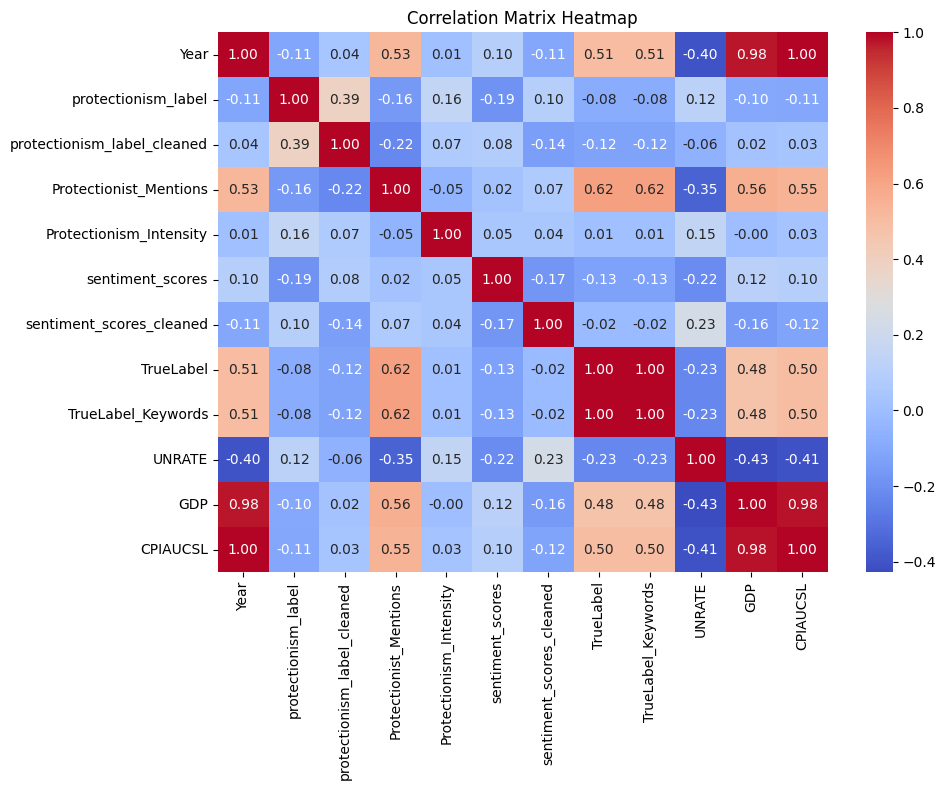

In [84]:
# heatmap

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.tight_layout()
plt.show()

In [ ]:
# i am just doing a bunch of different ones just to see what I can find
# we can alter/do new ones/ignore stupid ones

In [85]:
combined_df['theme_scores_cleaned'] = combined_df['theme_scores_cleaned'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

print("Sample theme_scores values:")
for i in range(5):
    print(combined_df['theme_scores_cleaned'].iloc[i])

Sample theme_scores values:
{'Targeted trade with specific countries': 0.1205659806728363, 'Support for domestic industry': 0.10481392592191696, 'Fair trade over free trade': 0.09701555222272873, 'National economic security': 0.08880109339952469, 'Protectionism': 0.08773303031921387, 'Economic independence': 0.07945326715707779, 'Job repatriation': 0.07803423702716827, 'Buy American rhetoric': 0.07180210947990417, 'Trade conflict': 0.06439325213432312, 'Opposition to outsourcing': 0.0640987977385521, 'Anti-globalization': 0.05638071149587631, 'Manufacturing and industrial revival': 0.03912724554538727, 'Trade deficits and imbalances': 0.0245773047208786, 'Tariffs and trade barriers': 0.023203551769256592}
{'Support for domestic industry': 0.09941481053829193, 'Targeted trade with specific countries': 0.09292714297771454, 'Anti-globalization': 0.08982338011264801, 'Protectionism': 0.08493254333734512, 'Opposition to outsourcing': 0.0848730131983757, 'Job repatriation': 0.077236540615558

In [86]:
# Normalize keys to lowercase in theme_scores
combined_df['theme_scores_cleaned'] = combined_df['theme_scores_cleaned'].apply(
    lambda d: {k.lower(): v for k, v in d.items()} if isinstance(d, dict) else {}
)

# Convert list of protectionism labels to lowercase for comparison
protectionism_labels_lower = [label.lower() for label in protectionism_labels]

# Create a new DataFrame with just the lowercase theme scores
theme_df = pd.DataFrame(combined_df['theme_scores_cleaned'].tolist())

# Ensure all protectionism-related themes are present
for label in protectionism_labels_lower:
    if label not in theme_df.columns:
        theme_df[label] = np.nan  # Fill missing ones with NaN

# economic variables
econ_vars = [ 'GDP', 'UNRATE','CPIAUCSL']

# Concatenate with economic variables
corr_df = pd.concat([theme_df, combined_df[econ_vars].reset_index(drop=True)], axis=1)

# Compute correlation matrix
theme_econ_corr = corr_df.corr().loc[protectionism_labels_lower, econ_vars]
print(theme_econ_corr)

                                             GDP    UNRATE  CPIAUCSL
protectionism                          -0.046103 -0.016061 -0.054242
economic independence                   0.295057 -0.159324  0.296888
tariffs and trade barriers             -0.080811  0.077497  0.012949
trade conflict                         -0.251195  0.230155 -0.222111
anti-globalization                      0.281389 -0.059678  0.219049
support for domestic industry           0.006353  0.108712 -0.049759
buy american rhetoric                   0.252117 -0.119538  0.263909
job repatriation                        0.347991 -0.047392  0.337213
national economic security             -0.062905 -0.222827 -0.100178
fair trade over free trade             -0.027117 -0.198783 -0.022346
manufacturing and industrial revival    0.410684 -0.094483  0.409430
trade deficits and imbalances          -0.301062  0.148059 -0.231674
opposition to outsourcing              -0.030945  0.129077 -0.083465
targeted trade with specific count

Breakdown of results:

In [87]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_path = '/Users/angelbrummett/Library/Fonts/AtkinsonHyperlegible-Regular.ttf'  # Update with the actual path
font_prop = fm.FontProperties(fname=font_path)

font_name = font_prop.get_name()
print(f"Loaded font name: {font_name}")

plt.rcParams['font.family'] = font_name

Loaded font name: Atkinson Hyperlegible


In [88]:
fm.fontManager.addfont('/Users/angelbrummett/Library/Fonts/AtkinsonHyperlegible-Regular.ttf')
print(fm.FontProperties(fname='/Users/angelbrummett/Library/Fonts/AtkinsonHyperlegible-Regular.ttf').get_name())

Atkinson Hyperlegible


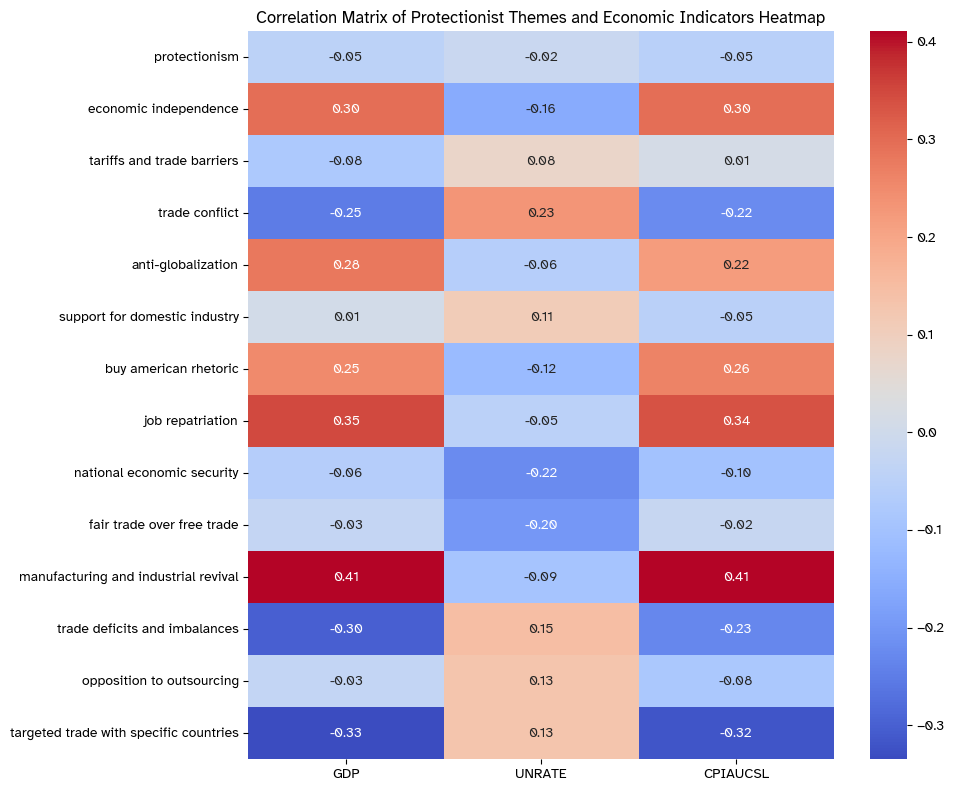

In [89]:
# heatmap visualisation
plt.figure(figsize=(10, 8))
sns.heatmap(theme_econ_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Protectionist Themes and Economic Indicators Heatmap")
ax = plt.gca()
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set_fontproperties(font_prop)

plt.tight_layout()
plt.show()

Breakdown of results:

In [90]:
# by president??

# Add president name to the theme scores DataFrame
theme_df['President'] = combined_df['President']

# Group by President and calculate the average of each theme
theme_by_president = theme_df.groupby('President')[protectionism_labels_lower].mean().round(4)

# View the result
print(theme_by_president)

                            protectionism  economic independence  \
President                                                          
Barack Obama                       0.0789                 0.0832   
Bill Clinton                       0.0763                 0.0829   
Donald Trump                       0.0750                 0.0789   
George Herbert Walker Bush         0.0746                 0.0704   
George W. Bush                     0.0834                 0.0824   
Gerald Ford                        0.0814                 0.0773   
Jimmy Carter                       0.0790                 0.0769   
Joseph R. Biden, Jr.               0.0757                 0.0827   
Richard Nixon                      0.0877                 0.0795   
Ronald Reagan                      0.0742                 0.0708   

                            tariffs and trade barriers  trade conflict  \
President                                                                
Barack Obama                       

Breakdown of results:

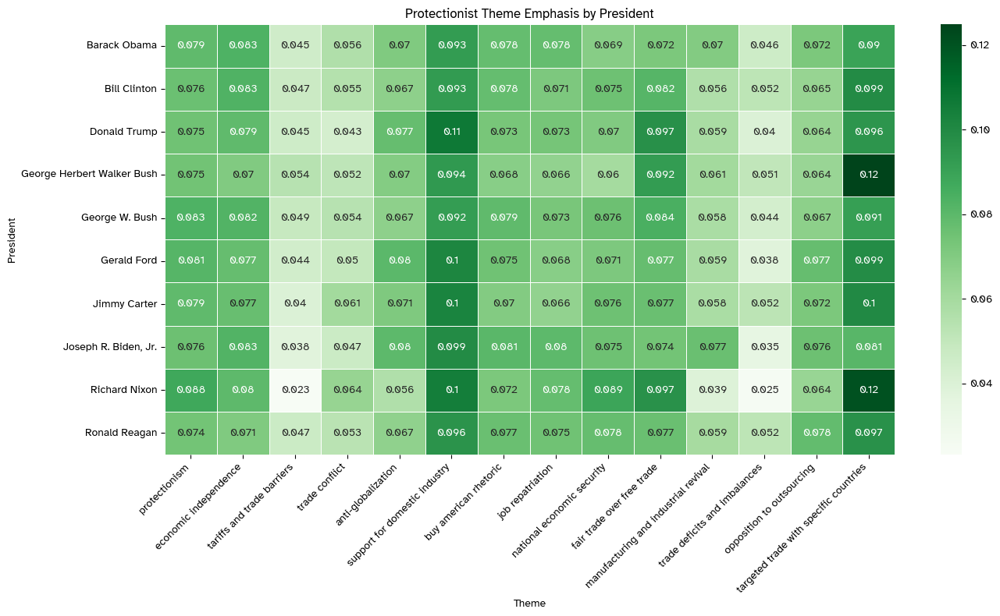

In [91]:
#heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(theme_by_president, annot=True, cmap='Greens', linewidths=0.5)
plt.title("Protectionist Theme Emphasis by President")
plt.xlabel("Theme")
plt.ylabel("President")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

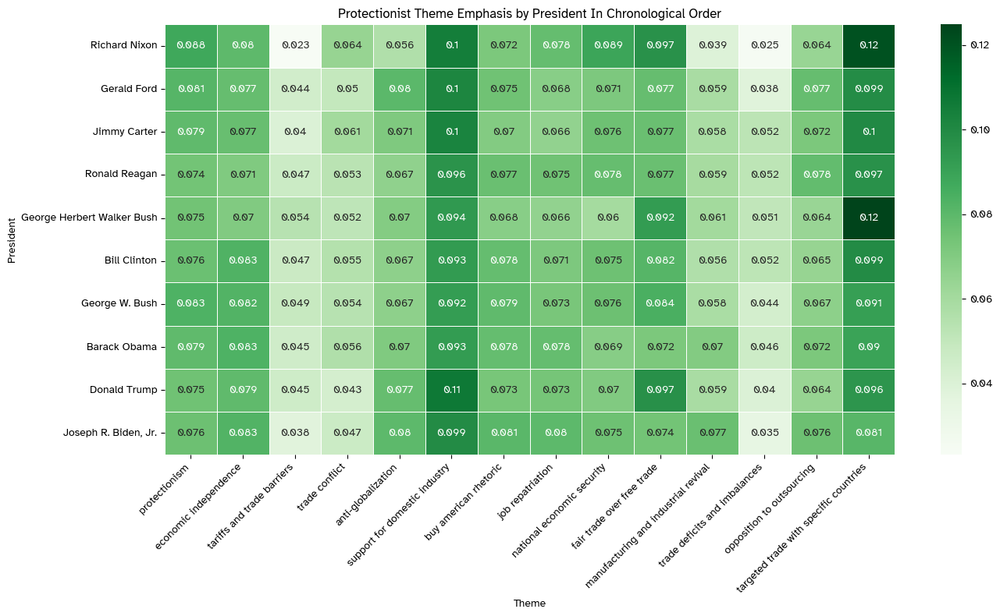

<Figure size 640x480 with 0 Axes>

In [ ]:
# organise this heatmap chronomlogically 

# Add a chronological order column to the DataFrame
chronological_order = {
	'Richard Nixon': 1,
	'Gerald Ford': 2,
	'Jimmy Carter': 3,
	'Ronald Reagan': 4,
	'George Herbert Walker Bush': 5,
	'Bill Clinton': 6,
	'George W. Bush': 7,
	'Barack Obama': 8,
	'Donald Trump': 9,
	'Joseph R. Biden, Jr.': 10
}

theme_by_president['Chronological_Order'] = theme_by_president.index.map(chronological_order)

# sort by chronological order
theme_by_president = theme_by_president.sort_values('Chronological_Order').drop('Chronological_Order', axis=1)

# heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(theme_by_president, annot=True, cmap='Greens', linewidths=0.5)
plt.title("Protectionist Theme Emphasis by President In Chronological Order")
plt.xlabel("Theme")
plt.ylabel("President")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

plt.savefig('heatmap_protectionist_theme_chronologica;.png', dpi=300, bbox_inches='tight')  # Save as PNG with high resolution

Breakdown of results:

In [ ]:
# we could also do bar charts by theme???

Known Crisis Years:

1980–82: Early '80s recession (JC, RR)

1990–91: Gulf War recession (GHWB)

2007–09: Global financial crisis (BB)

2020: COVID-19 recession (DT)

Key Events

9/11/2001 - World Trade Centre

In [92]:
# known crisis years
crisis_years = [1980, 1981, 1982, 1990, 1991, 2007, 2008, 2009, 2020]

combined_df['Crisis_Year'] = combined_df['Year'].apply(lambda x: 1 if x in crisis_years else 0)

crisis_years = combined_df.loc[combined_df['Crisis_Year'] == 1, 'Year'].unique().tolist()

In [93]:
# emprical

# negative gdp growth
combined_df['GDP_Growth'] = combined_df['GDP'].pct_change()
combined_df['GDP_Crisis'] = (combined_df['GDP_Growth'] < 0).astype(int)

# unemployment spikes - crisis as unemployment > mean + 1 standard deviation
unrate_mean = combined_df['UNRATE'].mean()
unrate_std = combined_df['UNRATE'].std()
combined_df['UNRATE_Crisis'] = (combined_df['UNRATE'] > (unrate_mean + unrate_std)).astype(int)

# CPI Shocks (Inflation)
combined_df['CPI_Change'] = combined_df['CPIAUCSL'].pct_change()
combined_df['CPI_Crisis'] = (combined_df['CPI_Change'].abs() > combined_df['CPI_Change'].std()).astype(int)

# combine into one (should present as a 0 or 1)
combined_df['Crisis_Score'] = (
    combined_df['GDP_Crisis'] |
    combined_df['UNRATE_Crisis'] |
    combined_df['CPI_Crisis']
)


In [94]:
# calculate the severity of the crisis

combined_df['Crisis_Severity'] = (
    combined_df['GDP_Crisis'] +
    combined_df['UNRATE_Crisis'] +
    combined_df['CPI_Crisis']
)

In [95]:
# save as csv!
combined_df.to_csv('combined_sotu_econ_crisis_df_2.csv', index=False)


ModuleNotFoundError: No module named 'google.colab'

In [ ]:
# run if using in colab
from google.colab import drive
drive.mount('/content/drive')
combined_df.to_csv('/content/drive/My Drive/combined_sotu_econ_crisis_df.csv', index=False)

In [96]:
# colour palette - this was to match our presentation colour scheme

colors = {
    'olive': '#A8A072',
    'dark_olive': '#5E573F',
    'black': '#000000',
    'background': '#F9F9F9'
}


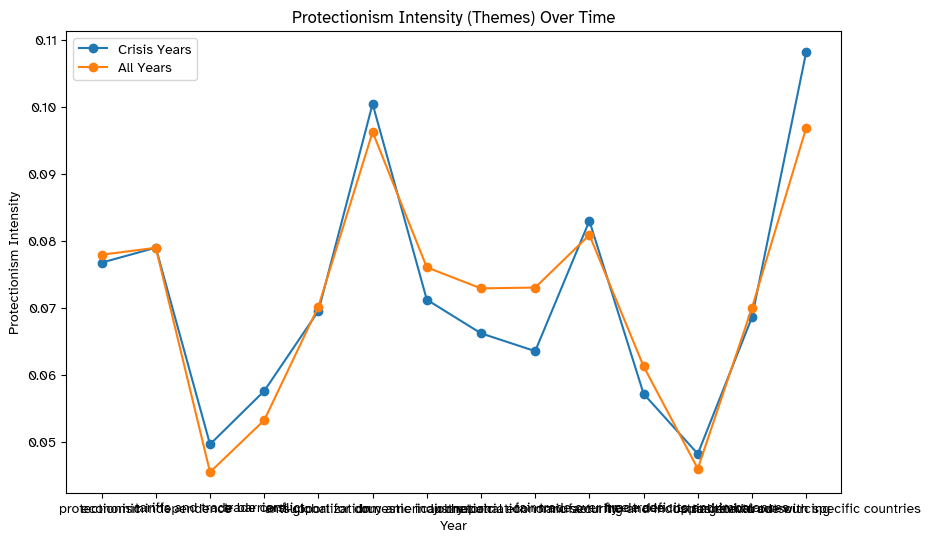

In [97]:
# did rhetoric increase during crisis years?

# protectionist theme scores

# Assuming 'protectionism_labels' contains your theme labels
combined_df['theme_scores_cleaned'] = combined_df['theme_scores_cleaned'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

for theme in protectionism_labels:
    combined_df[theme.lower()] = combined_df['theme_scores_cleaned'].apply(lambda x: x.get(theme.lower(), np.nan))  # Extract theme score

# yearly
yearly_avg = combined_df[[theme.lower() for theme in protectionism_labels]].mean() # This line is added

# Calculate crisis-year-only averages for each theme individually
crisis_years = combined_df.loc[combined_df['Crisis_Year'] == 1, 'Year'].unique().tolist()
crisis_yearly_avg = combined_df[combined_df['Year'].isin(crisis_years)][[theme.lower() for theme in protectionism_labels]].mean()


# Visualize: time series plot

# Plot using correct x-axis for both series
plt.figure(figsize=(10, 6))
plt.plot(crisis_yearly_avg.index, crisis_yearly_avg.values, marker='o', label='Crisis Years')
plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label='All Years')

plt.xlabel('Year')
plt.ylabel('Protectionism Intensity')
plt.title('Protectionism Intensity (Themes) Over Time')
plt.legend()
plt.show()

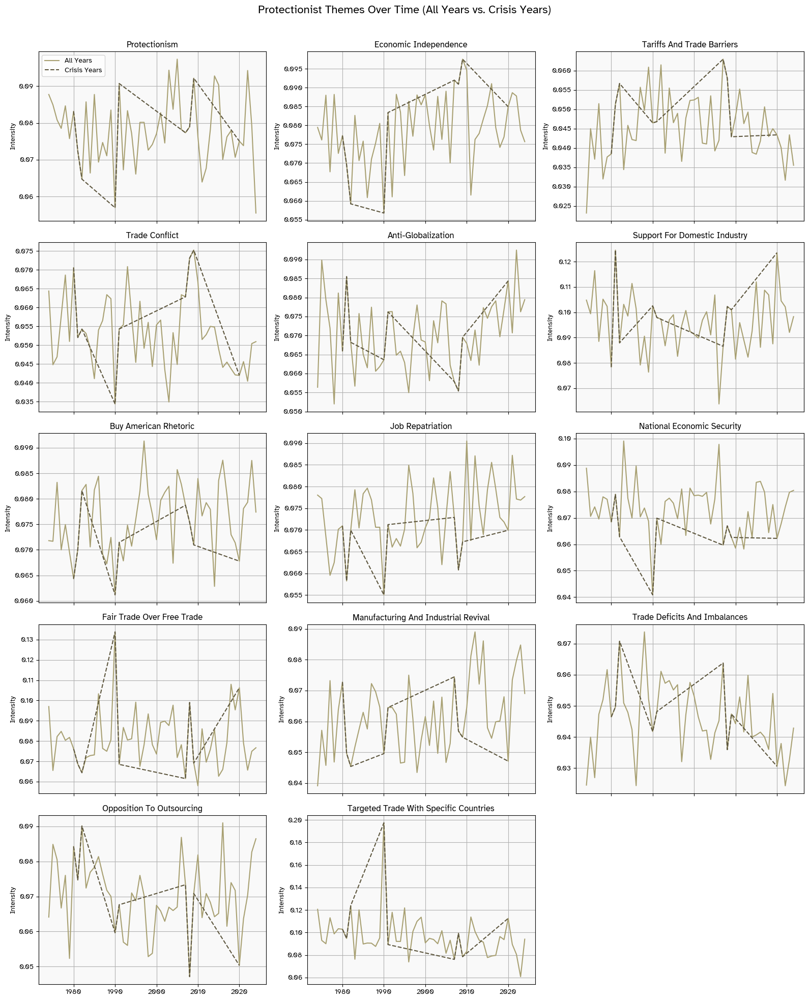

<Figure size 640x480 with 0 Axes>

In [98]:

themes_to_plot = protectionism_labels  
n = len(themes_to_plot)

# Set up subplots (adjust rows/cols as needed)
n_cols = 3
n_rows = int(np.ceil(n / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows), sharex=True)
axs = axs.flatten()

for i, theme in enumerate(themes_to_plot):
    theme_col = theme.lower()

    # Average intensity per year
    all_years_avg = combined_df.groupby('Year')[theme_col].mean()
    crisis_years_avg = combined_df[combined_df['Crisis_Year'] == 1].groupby('Year')[theme_col].mean()

    # Plot on its own axis
    axs[i].plot(all_years_avg.index, all_years_avg.values, label='All Years', color=colors['olive'])
    axs[i].plot(crisis_years_avg.index, crisis_years_avg.values, linestyle='--', label='Crisis Years', color=colors['dark_olive'])
    axs[i].set_title(theme.title(), color=colors['black'])
    axs[i].set_ylabel('Intensity', color=colors['black'])
    axs[i].tick_params(colors=colors['black'])
    axs[i].grid(True)
    axs[i].set_facecolor(colors['background'])

# Final touches
for ax in axs[len(themes_to_plot):]:  # Hide unused axes
    ax.axis('off')

axs[0].legend()
plt.xlabel('Year')
plt.suptitle('Protectionist Themes Over Time (All Years vs. Crisis Years)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

plt.savefig('protectionist_themes.png', dpi=300, bbox_inches='tight')

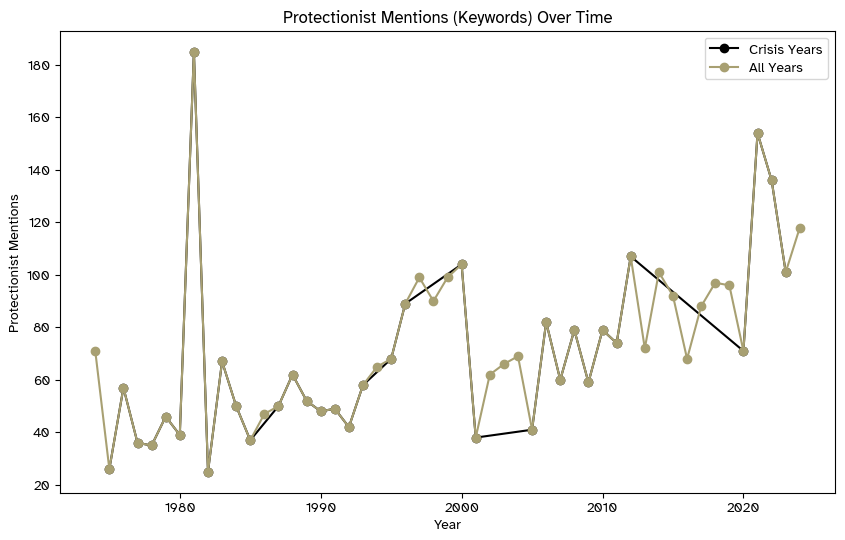

In [99]:
# Separate out crisis years
crisis_df = combined_df[combined_df['Crisis_Score'] == True]

# Compute averages by actual year
crisis_yearly_avg = crisis_df.groupby('Year')['Protectionist_Mentions'].mean()
yearly_avg = combined_df.groupby('Year')['Protectionist_Mentions'].mean()

# Visualize: time series plot
plt.figure(figsize=(10, 6))
plt.plot(crisis_yearly_avg.index, crisis_yearly_avg.values, marker='o', label='Crisis Years',color=colors['black'])
plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label='All Years', color=colors['olive'])

plt.xlabel('Year')
plt.ylabel('Protectionist Mentions')
plt.title('Protectionist Mentions (Keywords) Over Time')
plt.legend()
plt.show()

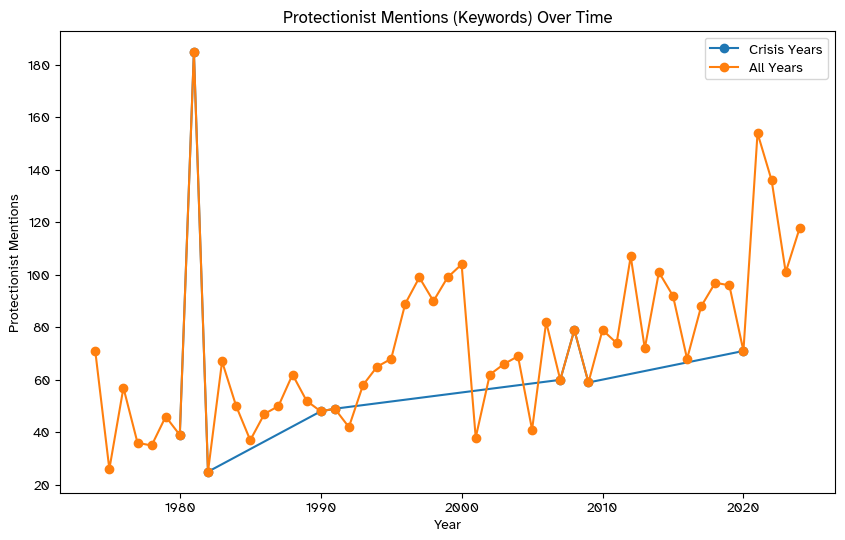

In [100]:
# Separate out crisis years
crisis_df = combined_df[combined_df['Crisis_Year'] == True]

# Compute averages by actual year
crisis_yearly_avg = crisis_df.groupby('Year')['Protectionist_Mentions'].mean()
yearly_avg = combined_df.groupby('Year')['Protectionist_Mentions'].mean()

# Visualize: time series plot
plt.figure(figsize=(10, 6))
plt.plot(crisis_yearly_avg.index, crisis_yearly_avg.values, marker='o', label='Crisis Years')
plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label='All Years')

plt.xlabel('Year')
plt.ylabel('Protectionist Mentions')
plt.title('Protectionist Mentions (Keywords) Over Time')
plt.legend()
plt.show()

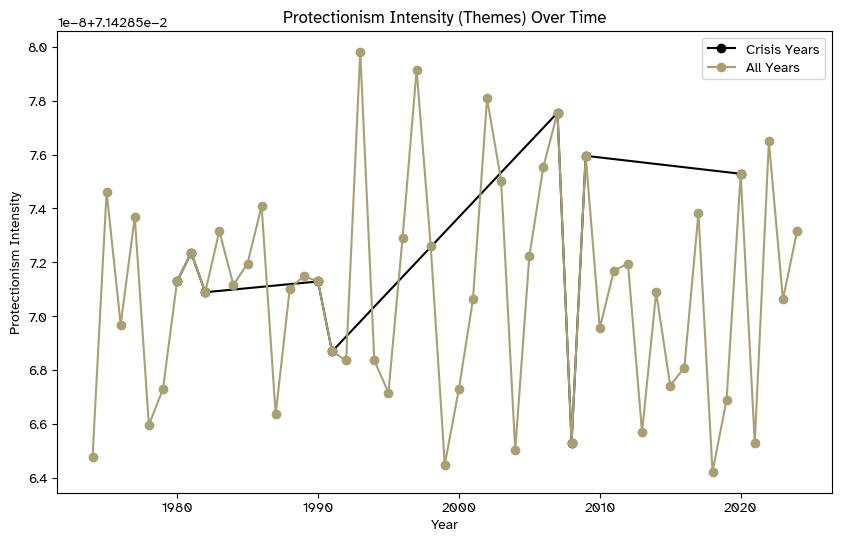

In [120]:
# Separate out crisis years
crisis_df = combined_df[combined_df['Crisis_Year'] == True]

# Compute averages by actual year
crisis_yearly_avg = crisis_df.groupby('Year')['Protectionism_Intensity'].mean()
yearly_avg = combined_df.groupby('Year')['Protectionism_Intensity'].mean()

# Visualize: time series plot
plt.figure(figsize=(10, 6))
plt.plot(crisis_yearly_avg.index, crisis_yearly_avg.values, marker='o', label='Crisis Years',color=colors['black'])
plt.plot(yearly_avg.index, yearly_avg.values, marker='o', label='All Years', color=colors['olive'])

plt.xlabel('Year')
plt.ylabel('Protectionism Intensity')
plt.title('Protectionism Intensity (Themes) Over Time')
plt.legend()
plt.show()

In [60]:
print(yearly_avg.index[:5])
print(type(yearly_avg.index[0]))

Index([1974, 1975, 1976, 1977, 1978], dtype='int64', name='Year')
<class 'numpy.int64'>


In [61]:
print(crisis_years[:10])
print(type(crisis_years[0]))

[1980, 1981, 1982, 1990, 1991, 2007, 2008, 2009, 2020]
<class 'int'>


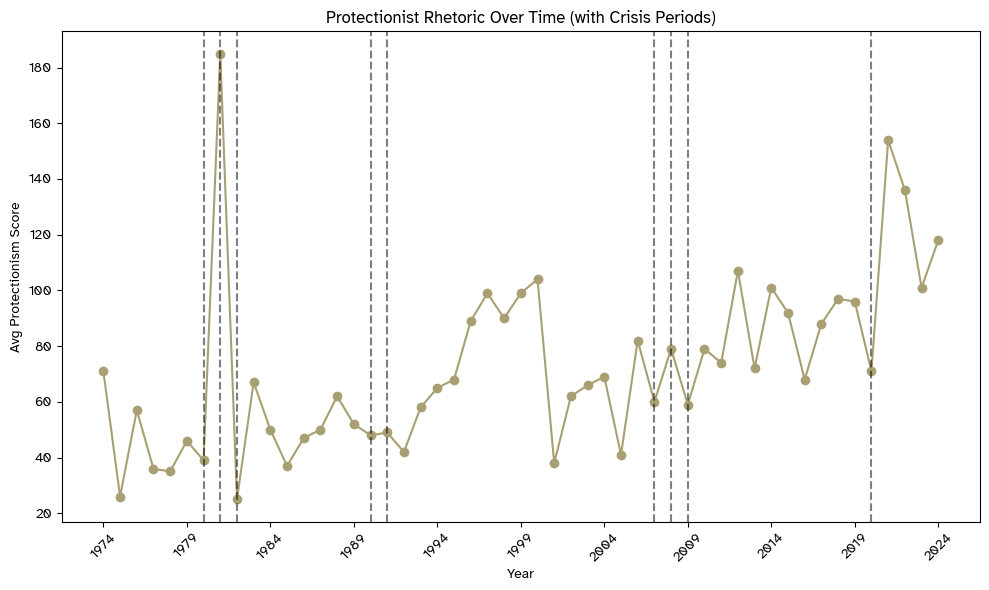

In [101]:
ax = yearly_avg.plot(marker='o', color=colors['olive'], figsize=(10, 6))

for year in crisis_years:
    ax.axvline(x=year, color=colors['black'], linestyle='--', alpha=0.5)

ax.set_title("Protectionist Rhetoric Over Time (with Crisis Periods)")
ax.set_xlabel("Year")
ax.set_ylabel("Avg Protectionism Score")
plt.xticks(ticks=range(yearly_avg.index.min(), yearly_avg.index.max()+1, 5), rotation=45)
plt.tight_layout()
plt.show()

In [96]:
# regression
# y'all idk i am trying EVERYTHING

# tells us if crisis years significantly predict increases in protectionist rhetoric.

X = combined_df[['Crisis_Year']]
X = sm.add_constant(X)
y = combined_df['Protectionism_Intensity']

model = sm.OLS(y, X).fit()
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.018
Model:                                 OLS   Adj. R-squared:                 -0.002
Method:                      Least Squares   F-statistic:                    0.9007
Date:                     Tue, 22 Apr 2025   Prob (F-statistic):              0.347
Time:                             00:02:04   Log-Likelihood:                 914.46
No. Observations:                       51   AIC:                            -1825.
Df Residuals:                           49   BIC:                            -1821.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------


In [97]:
# regression
# y'all idk i am trying EVERYTHING

# tells us if crisis years significantly predict increases in protectionist rhetoric.

X = combined_df[['Crisis_Score']]
X = sm.add_constant(X)
y = combined_df['Protectionism_Intensity']

model = sm.OLS(y, X).fit()
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.020
Model:                                 OLS   Adj. R-squared:                  0.000
Method:                      Least Squares   F-statistic:                     1.009
Date:                     Tue, 22 Apr 2025   Prob (F-statistic):              0.320
Time:                             00:02:16   Log-Likelihood:                 914.51
No. Observations:                       51   AIC:                            -1825.
Df Residuals:                           49   BIC:                            -1821.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

In [98]:
# identify crisis scores through
X = combined_df[['Crisis_Year']]
X = sm.add_constant(X)
y = combined_df['Protectionist_Mentions']

model = sm.OLS(y, X).fit()
print(model.summary())

                              OLS Regression Results                              
Dep. Variable:     Protectionist_Mentions   R-squared:                       0.004
Model:                                OLS   Adj. R-squared:                 -0.016
Method:                     Least Squares   F-statistic:                    0.1983
Date:                    Tue, 22 Apr 2025   Prob (F-statistic):              0.658
Time:                            00:02:21   Log-Likelihood:                -248.37
No. Observations:                      51   AIC:                             500.7
Df Residuals:                          49   BIC:                             504.6
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const     

In [99]:
# identify crisis scores through
X = combined_df[['Crisis_Score']]
X = sm.add_constant(X)
y = combined_df['Protectionism_Intensity']

model = sm.OLS(y, X).fit()
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.020
Model:                                 OLS   Adj. R-squared:                  0.000
Method:                      Least Squares   F-statistic:                     1.009
Date:                     Tue, 22 Apr 2025   Prob (F-statistic):              0.320
Time:                             00:02:27   Log-Likelihood:                 914.51
No. Observations:                       51   AIC:                            -1825.
Df Residuals:                           49   BIC:                            -1821.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

In [100]:
# identify crisis scores through
X = combined_df[['Crisis_Severity']]
X = sm.add_constant(X)
y = combined_df['Protectionist_Mentions']

model = sm.OLS(y, X).fit()
print(model.summary())

                              OLS Regression Results                              
Dep. Variable:     Protectionist_Mentions   R-squared:                       0.074
Model:                                OLS   Adj. R-squared:                  0.055
Method:                     Least Squares   F-statistic:                     3.911
Date:                    Tue, 22 Apr 2025   Prob (F-statistic):             0.0536
Time:                            00:02:32   Log-Likelihood:                -246.52
No. Observations:                      51   AIC:                             497.0
Df Residuals:                          49   BIC:                             500.9
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
co

In [128]:
# identify crisis scores through
X = combined_df[['Crisis_Severity']]
X = sm.add_constant(X)
y = combined_df['Protectionism_Intensity']

model = sm.OLS(y, X).fit()
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.053
Model:                                 OLS   Adj. R-squared:                  0.034
Method:                      Least Squares   F-statistic:                     2.736
Date:                     Tue, 22 Apr 2025   Prob (F-statistic):              0.104
Time:                             01:48:56   Log-Likelihood:                 915.38
No. Observations:                       51   AIC:                            -1827.
Df Residuals:                           49   BIC:                            -1823.
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

In [125]:
model = smf.ols('Protectionist_Mentions ~ Crisis_Severity + C(Party)', data=combined_df).fit()
print(model.summary())

                              OLS Regression Results                              
Dep. Variable:     Protectionist_Mentions   R-squared:                       0.287
Model:                                OLS   Adj. R-squared:                  0.258
Method:                     Least Squares   F-statistic:                     9.683
Date:                    Tue, 22 Apr 2025   Prob (F-statistic):           0.000293
Time:                            01:39:04   Log-Likelihood:                -239.83
No. Observations:                      51   AIC:                             485.7
Df Residuals:                          48   BIC:                             491.5
Df Model:                               2                                         
Covariance Type:                nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

In [129]:
model_party = smf.ols('Protectionism_Intensity ~ Crisis_Severity + C(Party)', data=combined_df).fit()
print(model_party.summary())

# Example: use the fitted model
summary = model_party.summary()

# Save as text
with open("regression_results.txt", "w") as f:
    f.write(summary.as_text())

# Save as HTML
with open("regression_results.html", "w") as f:
    f.write(summary.as_html())


                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.054
Model:                                 OLS   Adj. R-squared:                  0.015
Method:                      Least Squares   F-statistic:                     1.376
Date:                     Tue, 22 Apr 2025   Prob (F-statistic):              0.262
Time:                             01:57:41   Log-Likelihood:                 915.41
No. Observations:                       51   AIC:                            -1825.
Df Residuals:                           48   BIC:                            -1819.
Df Model:                                2                                         
Covariance Type:                 nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

In [72]:
model = smf.ols('Protectionist_Mentions ~ Crisis_Score + C(Party)', data=combined_df).fit()
print(model.summary())

                              OLS Regression Results                              
Dep. Variable:     Protectionist_Mentions   R-squared:                       0.271
Model:                                OLS   Adj. R-squared:                  0.241
Method:                     Least Squares   F-statistic:                     8.926
Date:                    Mon, 21 Apr 2025   Prob (F-statistic):           0.000506
Time:                            14:05:32   Log-Likelihood:                -240.41
No. Observations:                      51   AIC:                             486.8
Df Residuals:                          48   BIC:                             492.6
Df Model:                               2                                         
Covariance Type:                nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

In [73]:
nb_model = smf.glm(
    formula='Protectionist_Mentions ~ Crisis_Severity + C(Party)',
    data=combined_df,
    family=sm.families.NegativeBinomial()
).fit()

print(nb_model.summary())

                   Generalized Linear Model Regression Results                    
Dep. Variable:     Protectionist_Mentions   No. Observations:                   51
Model:                                GLM   Df Residuals:                       48
Model Family:            NegativeBinomial   Df Model:                            2
Link Function:                        Log   Scale:                          1.0000
Method:                              IRLS   Log-Likelihood:                -268.47
Date:                    Mon, 21 Apr 2025   Deviance:                       6.0646
Time:                            14:05:40   Pearson chi2:                     6.30
No. Iterations:                         5   Pseudo R-squ. (CS):            0.05546
Covariance Type:                nonrobust                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


In [74]:
#tf - idf
vectorizer = TfidfVectorizer(vocabulary=protectionism_keywords_list)
tfidf_matrix = vectorizer.fit_transform(combined_df["Cleaned_Text"])

# Convert to DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

# Combine with original dataset
df_sotu2025 = pd.concat([df_sotu2025.reset_index(drop=True), tfidf_df], axis=1)

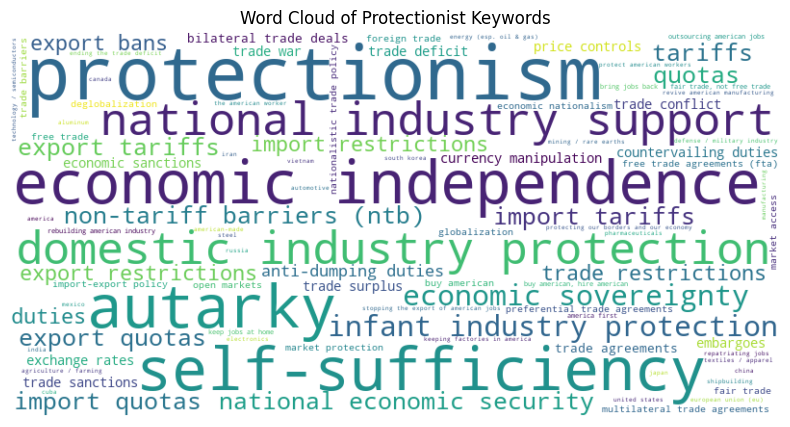

In [75]:
frequencies = {keyword: 1 for keyword in protectionism_keywords_list}

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(frequencies)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Protectionist Keywords')
plt.show()

In [76]:
top_n = 10
top_keywords_per_doc = tfidf_df.apply(lambda row: row.sort_values(ascending=False).head(top_n), axis=1)
print(top_keywords_per_doc)

    agriculture / farming  aluminum   america  america first  american-made  \
0                     NaN       NaN  0.993567            NaN            0.0   
1                     NaN       NaN  0.719173            NaN            NaN   
2                     NaN       NaN  0.988438            NaN            0.0   
3                     NaN  0.000000  0.834996            NaN            NaN   
4                     NaN       NaN  0.780507            NaN            NaN   
5                     NaN       NaN  0.965895            NaN            0.0   
6                     NaN       NaN  0.952133            NaN            0.0   
7                     NaN       NaN  0.504763            NaN            NaN   
8                     NaN  0.000000  1.000000            NaN            0.0   
9                     0.0  0.000000  0.978693            NaN            NaN   
10                    NaN       NaN  0.996850            NaN            0.0   
11                    NaN  0.000000  0.891726       

In [110]:
# lagging - how to measure effect of economic indicators of last year effect the protectionism scores of the speech from the following year

import statsmodels.api as sm  # Import the statsmodels library

# Create lagged columns
combined_df['GDP_Growth_lag1'] = combined_df['GDP_Growth'].shift(1)
combined_df['UNRATE_lag1'] = combined_df['UNRATE'].shift(1)
combined_df['CPI_Change_lag1'] = combined_df['CPI_Change'].shift(1)
combined_df['Crisis_Score_lag1'] = combined_df['Crisis_Score'].shift(1)
combined_df['Crisis_Severity_lag1'] = combined_df['Crisis_Severity'].shift(1)

# Drop rows with NaN values caused by lagging
combined_df = combined_df.dropna(subset=['GDP_Growth_lag1', 'UNRATE_lag1', 'CPI_Change_lag1', 'Crisis_Score_lag1', 'Crisis_Severity_lag1'])

# Define predictors
X = combined_df[['GDP_Growth_lag1', 'UNRATE_lag1', 'CPI_Change_lag1', 'Crisis_Score_lag1', 'Crisis_Severity_lag1']]
X = sm.add_constant(X)

# Dependent Variable 1: Protectionism_Intensity
y1 = combined_df['Protectionism_Intensity']
model1 = sm.OLS(y1, X, missing='drop').fit()

# Output summaries
print("== Protectionism Intensity ==")
print(model1.summary())

# Save regression results to a text file
with open('regression_results1.txt', 'w') as f:
    f.write(model1.summary().as_text())


== Protectionism Intensity ==
                               OLS Regression Results                              
Dep. Variable:     Protectionism_Intensity   R-squared:                       0.166
Model:                                 OLS   Adj. R-squared:                  0.059
Method:                      Least Squares   F-statistic:                     1.554
Date:                     Thu, 01 May 2025   Prob (F-statistic):              0.196
Time:                             11:45:15   Log-Likelihood:                 810.70
No. Observations:                       45   AIC:                            -1609.
Df Residuals:                           39   BIC:                            -1599.
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [109]:
# Dependent Variable 2: Protectionist_Mentions
y2 = combined_df['Protectionist_Mentions']
model2 = sm.OLS(y2, X, missing='drop').fit()

print("\n== Protectionist Mentions ==")
print(model2.summary())

# Save regression results to a text file
with open('regression_results2.txt', 'w') as f:
    f.write(model2.summary().as_text())


== Protectionist Mentions ==
                              OLS Regression Results                              
Dep. Variable:     Protectionist_Mentions   R-squared:                       0.211
Model:                                OLS   Adj. R-squared:                  0.112
Method:                     Least Squares   F-statistic:                     2.139
Date:                    Thu, 01 May 2025   Prob (F-statistic):             0.0804
Time:                            11:44:48   Log-Likelihood:                -218.36
No. Observations:                      46   AIC:                             448.7
Df Residuals:                          40   BIC:                             459.7
Df Model:                               5                                         
Covariance Type:                nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

In [111]:
# Dependent Variable 2: Protectionist_Mentions -> Negative Binomial
y2 = combined_df['Protectionist_Mentions']
model = sm.GLM(y2, X, family=sm.families.NegativeBinomial()).fit()

print("\n== Protectionist Mentions ==")
print(model.summary())

# Save regression results to a text file
with open('regression_resultsnb.txt', 'w') as f:
    f.write(model.summary().as_text())


== Protectionist Mentions ==
                   Generalized Linear Model Regression Results                    
Dep. Variable:     Protectionist_Mentions   No. Observations:                   45
Model:                                GLM   Df Residuals:                       39
Model Family:            NegativeBinomial   Df Model:                            5
Link Function:                        Log   Scale:                          1.0000
Method:                              IRLS   Log-Likelihood:                -239.68
Date:                    Thu, 01 May 2025   Deviance:                       5.6897
Time:                            17:37:50   Pearson chi2:                     6.11
No. Iterations:                        10   Pseudo R-squ. (CS):            0.03026
Covariance Type:                nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


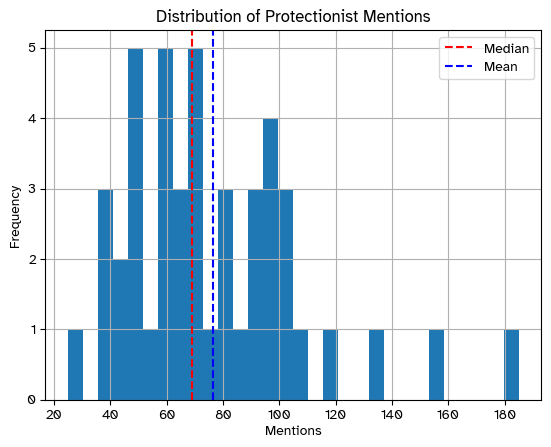

In [114]:
# to see the distribution of protectionist mentions 

combined_df["Protectionist_Mentions"].hist(bins=30)
plt.axvline(combined_df["Protectionist_Mentions"].median(), color='red', linestyle='--', label='Median')
plt.axvline(combined_df["Protectionist_Mentions"].mean(), color='blue', linestyle='--', label='Mean')
plt.legend()
plt.title("Distribution of Protectionist Mentions")
plt.xlabel("Mentions")
plt.ylabel("Frequency")
plt.show()

In [120]:
# Access specific counts from the sentiment_details_cleaned column in the combined dataset (for explanation why we didn't use it)
positive_count = combined_df["sentiment_scores_cleaned"].apply(
	lambda x: sum(1 for sentiment in x if isinstance(x, list) and sentiment.get('label') == 'POSITIVE') if isinstance(x, list) else 0
).sum()

negative_count = combined_df["sentiment_scores_cleaned"].apply(
	lambda x: sum(1 for sentiment in x if isinstance(x, list) and sentiment.get('label') == 'NEGATIVE') if isinstance(x, list) else 0
).sum()

print(f"Number of positive speeches: {positive_count}")
print(f"Number of negative speeches: {negative_count}")

Number of positive speeches: 0
Number of negative speeches: 0


In [117]:
combined_df.head(51)

,Year,President,Party,Title,Text,Cleaned_Text,protectionism_probs,protectionism_label,protectionism_probs_cleaned,protectionism_label_cleaned,...,fair trade over free trade,manufacturing and industrial revival,trade deficits and imbalances,opposition to outsourcing,targeted trade with specific countries,GDP_Growth_lag1,UNRATE_lag1,CPI_Change_lag1,Crisis_Score_lag1,Crisis_Severity_lag1
6,1980,Jimmy Carter,Democratic,Jimmy Carter's Third State of the Union Address,['This last few months has not been an easy ti...,'this last month easy time u meet tonight neve...,"[0.280499666929245, 0.7195003628730774]",1,"[0.015956861898303032, 0.9840431809425354]",1,...,0.076146,0.072755,0.046428,0.084278,0.102871,0.117251,5.850000,0.112530,1.0,1.0
7,1981,Jimmy Carter,Democratic,Jimmy Carter's Fourth State of the Union Address,"['To the Congress of the United States:', 'The...",'to congress united state 'the state union sou...,"[0.8378113508224487, 0.16218861937522888]",0,"[0.9765282273292542, 0.023471815511584282]",0,...,0.068708,0.049634,0.049654,0.074713,0.094701,0.087535,7.175000,0.135017,1.0,1.0
8,1982,Ronald Reagan,Republican,Ronald Reagan's First State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.7072977423667908, 0.29270222783088684]",0,"[0.0039596231654286385, 0.9960403442382812]",1,...,0.064408,0.045384,0.070743,0.090135,0.123893,0.122399,7.616667,0.103783,1.0,1.0
9,1983,Ronald Reagan,Republican,Ronald Reagan's Second State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.8743921518325806, 0.12560784816741943]",0,"[0.722859263420105, 0.277140736579895]",0,...,0.071862,0.051705,0.050925,0.072398,0.076226,0.042640,9.708333,0.061584,1.0,2.0
10,1984,Ronald Reagan,Republican,Ronald Reagan's Third State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.8833863735198975, 0.11661361902952194]",0,"[0.004588546697050333, 0.9954114556312561]",1,...,0.072847,0.057373,0.047919,0.076903,0.120050,0.086802,9.600000,0.031595,1.0,2.0
11,1985,Ronald Reagan,Republican,Ronald Reagan's Fourth State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.9964003562927246, 0.0035996276419609785]",0,"[0.8966385722160339, 0.10336141288280487]",0,...,0.073197,0.062938,0.042415,0.078345,0.089763,0.111055,7.508333,0.043682,1.0,1.0
12,1986,Ronald Reagan,Republican,Ronald Reagan's Fifth State of the Union Address,"Mr. Speaker, Mr. President, distinguished Memb...",mr . speaker mr . president distinguished memb...,"[0.015676241368055344, 0.9843237996101379]",1,"[0.15343070030212402, 0.846569299697876]",1,...,0.103297,0.057537,0.024406,0.081382,0.090598,0.074640,7.191667,0.035279,1.0,1.0
13,1987,Ronald Reagan,Republican,Ronald Reagan's Sixth State of the Union Address,"['Thank you very much. Mr. Speaker, Mr. Presid...",'thank much mr . speaker mr . president distin...,"[0.3232771158218384, 0.6767229437828064]",1,"[0.001997860847041011, 0.9980021119117737]",1,...,0.076367,0.072254,0.053501,0.076364,0.090444,0.055463,7.000000,0.019439,0.0,0.0
14,1988,Ronald Reagan,Republican,Ronald Reagan's Seventh State of the Union Add...,"Mr. Speaker, Mr. President, and distinguished ...",mr . speaker mr . president distinguished memb...,"[0.9824934005737305, 0.01750658079981804]",0,"[0.8803859353065491, 0.11961399018764496]",0,...,0.074986,0.069625,0.073727,0.071787,0.087591,0.060176,6.175000,0.035782,1.0,1.0
15,1989,George Herbert Walker Bush,Republican,George H. W. Bush's First State of the Union A...,"['Mr. Speaker, Mr. President, and distinguishe...",'mr speaker mr . president distinguished membe...,"[0.9859510064125061, 0.014049009419977665]",0,"[0.5349694490432739, 0.46503058075904846]",0,...,0.080610,0.064663,0.052273,0.070020,0.095169,0.078518,5.491667,0.041000,1.0,1.0
